In [1]:
# OPTIONAL: Load the "autoreload" extension so that code can change
%load_ext autoreload

# OPTIONAL: always reload modules so that as you change code in src, it gets loaded
%autoreload 2

%matplotlib inline

In [2]:
import os, sys
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
sys.path.append("/home/Developer/NCSN-TF2.0/")

import PIL
import utils, configs
import argparse
import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
import matplotlib.pyplot as plt

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from helper import plot_confusion_matrix, metrics

from ood_detection_helper import *
from datasets.dataset_loader import  *
from tqdm import tqdm
from sklearn.metrics import classification_report, average_precision_score
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc

from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from PIL import Image
from IPython.display import display
from matplotlib.pyplot import imshow
from datetime import datetime

import seaborn as sns
import plotly as py
import plotly.graph_objs as go

import umap
from sklearn.preprocessing import MinMaxScaler 

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 18

sns.set(style="darkgrid")
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16

seed=42
tf.random.set_seed(seed)
np.random.seed(seed)

print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.config.experimental.list_physical_devices('GPU'))
tf.__version__

Num GPUs Available:  0
[]


'2.2.0'

In [3]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

## Loading OOD datasets

In [56]:
with open("scores_cifar.p", "rb") as f:
    score_dict = pickle.load(f)
    
train_scores = score_dict["train"]
val_scores = score_dict["val"]
test_scores = score_dict["test"]

In [57]:
train_scores.shape, val_scores.shape, test_scores.shape

((47500, 10), (2500, 10), (10000, 10))

In [93]:
# with open("scores_ckpt-9.p", "rb") as f:
#     score_dict = pickle.load(f)
# score_dict.keys()

In [94]:
# inlier_scores = score_dict["cifar"]
# outlier_scores = [score_dict["celeba"], score_dict["svhn"]]

In [104]:
outlier_scores = []
with open("ood_scores_95_5.p", "rb") as f:
    ood_dict = pickle.load(f)
outlier_scores.extend([x for x in ood_dict.values()])

In [105]:
ood_dict.keys()

dict_keys(['LSUN', 'LSUN_resize', 'Imagenet', 'Imagenet_resize', 'iSUN', 'gaussian', 'uniform', 'svhn'])

In [97]:
# ood_dict["svhn"] = score_dict["svhn"]

In [106]:
ood_names = list(ood_dict.keys())
ood_names, len(outlier_scores)

(['LSUN',
  'LSUN_resize',
  'Imagenet',
  'Imagenet_resize',
  'iSUN',
  'gaussian',
  'uniform',
  'svhn'],
 8)

In [107]:
LABELS = np.array(["Train", "CIFAR",'LSUN','LSUN_resize',
                   'Imagenet','Imagenet_resize','iSUN',"Gaussian", "Uniform", "SVHN"])
COLORS = sns.color_palette("bright")

In [109]:
names = ["cifar", "svhn", "LSUN", "Imagenet", "iSUN"]

all_samples = np.concatenate([test_scores, *[ood_dict[n] for n in names[1:]]])

all_labels = [0] * len(inlier_scores)
for idx,n in enumerate(names[1:]):
    all_labels += [idx+1]*len(ood_dict[n])

captions = [names[x] for x in all_labels]

all_samples.shape, len(all_labels), len(captions)

((64925, 10), 64925, 64925)

In [110]:
%%time
import umap

umapper = umap.UMAP(n_components = 3,
                    n_neighbors=15,
                    min_dist=0)

embedding = umapper.fit_transform(all_samples)


CPU times: user 20min 57s, sys: 3min 30s, total: 24min 28s
Wall time: 1min 10s


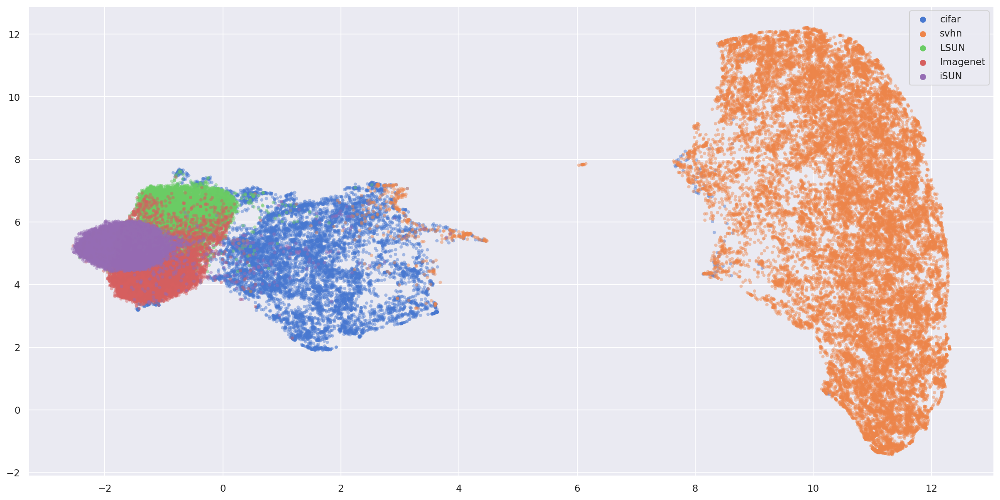

In [111]:
plot_embedding(embedding, all_labels, captions)

## Train Data = L2-norm(Pixel Scores)

In [60]:
X_train = val_scores
X_test = test_scores

## GMM

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    8.8s finished


Best: 2.474251 using {'GMM__covariance_type': 'full', 'GMM__n_components': 6}
---------------------------------------------------------------------------
2.286733 (0.325297) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 2}
2.466187 (0.341797) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 4}
2.474251 (0.339710) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 6}
2.416975 (0.355039) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 8}
2.375661 (0.341757) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 10}
2.302216 (0.325660) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 12}
2.229918 (0.345137) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 14}
2.167467 (0.336949) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 16}
2.133463 (0.378311) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 18}
2.021603 (0.385082) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 20}
CPU times:

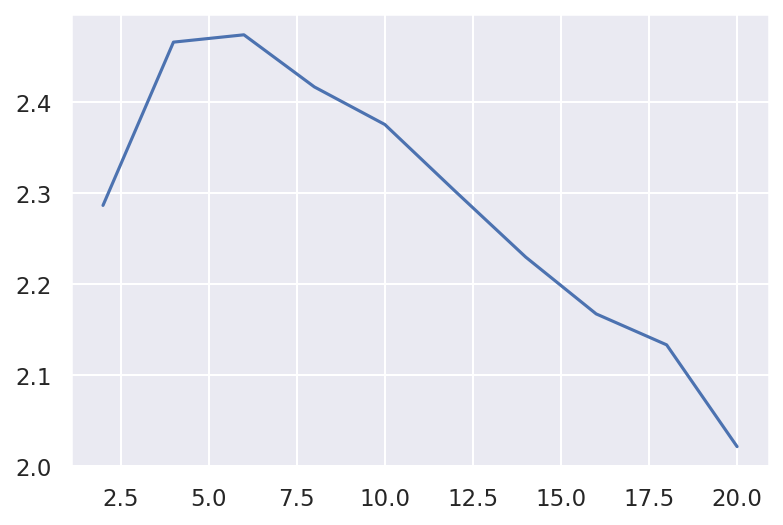

In [78]:
%%time
best_gmm_clf = train_gmm(X_train, verbose=True)

In [112]:
print("---Likelihoods---")
print("Training: {:.3f}".format(best_gmm_clf.score(X_train)))
print("{}: {:.3f}".format(LABELS[1], best_gmm_clf.score(X_test)))

for name, ood in zip(LABELS[2:], outlier_scores):
    print("{}: {:.3f}".format(name, best_gmm_clf.score(ood)))

---Likelihoods---
Training: 2.703
CIFAR: 2.476
LSUN: -1678.070
LSUN_resize: -1049.755
Imagenet: -1057.833
Imagenet_resize: -1359.195
iSUN: -1064.617
Gaussian: -1502369.357
Uniform: -1449063.378
SVHN: -6.904


In [113]:
%%time
train_score = best_gmm_clf.score_samples(X_train)
test_score = best_gmm_clf.score_samples(X_test)
ood_scores = [best_gmm_clf.score_samples(ood) for ood in outlier_scores]

CPU times: user 5.56 s, sys: 12 s, total: 17.6 s
Wall time: 439 ms


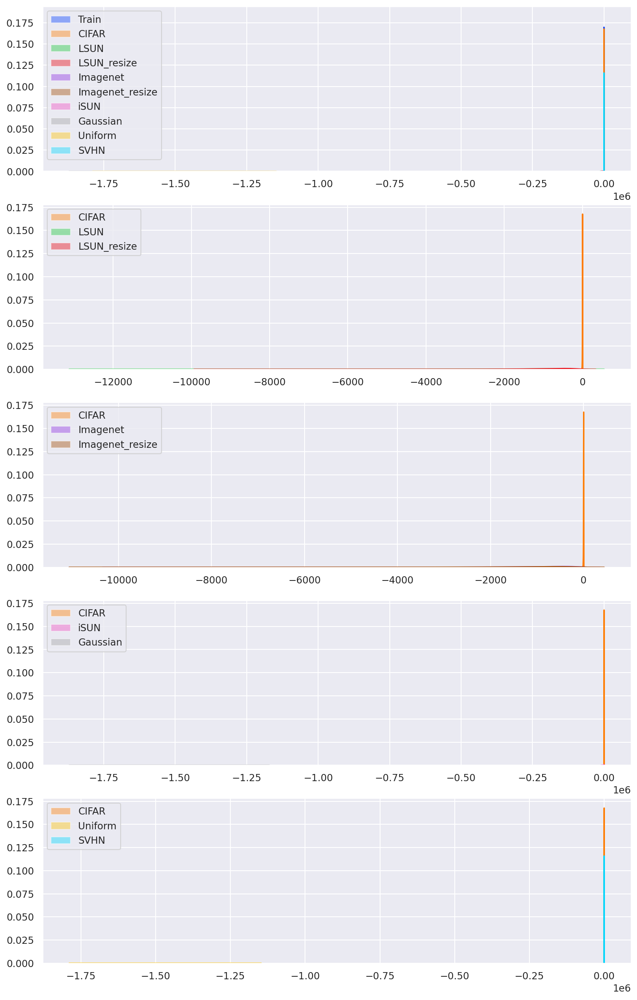

In [114]:
evaluate_model(train_score, test_score, ood_scores, labels=LABELS)

# OOD Evaluation

CIFAR vs LSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs LSUN_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Imagenet
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Imagenet_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs iSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Gaussian
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Uniform
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs SVHN
----------------
ROC-AUC: 0.9741
PR-AUC (In/Out): 0.9842 / 0.9605
FPR (95% TPR) Prec: 8.51%



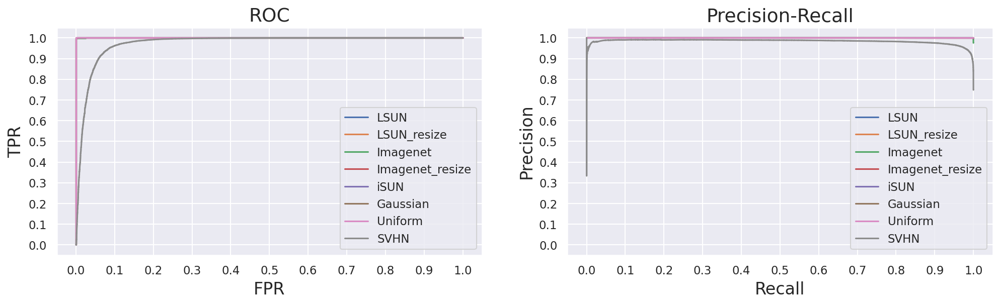

In [115]:
fig, axs = plt.subplots(1,2, figsize=(16,4))

for idx, _score in enumerate(ood_scores):
    ood_metrics(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]),
                    plot=False, verbose=True)
    print()
    plot_curves(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]), figure=(fig, axs))

plt.show()

In [116]:
all_images = np.concatenate(ood_scores[1:])
all_images.shape

(84925,)

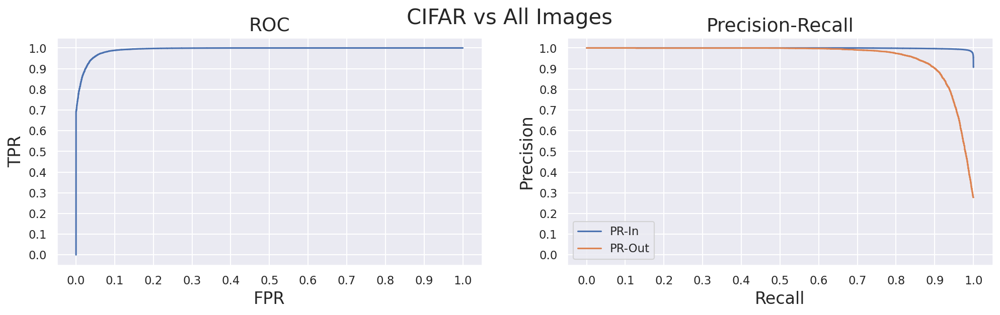

CIFAR vs All Images
----------------
ROC-AUC: 0.9921
PR-AUC (In/Out): 0.9990 / 0.9605
FPR (95% TPR) Prec: 4.25%


{'roc_auc': 0.9920626705916986,
 'fpr_tpr95': 0.0425,
 'fpr_tpr80': 0.0085,
 'pr_auc_in': 0.9990034649420747,
 'pr_auc_out': 0.96047636653144,
 'ap': 0.9990034712429043}

In [118]:
ood_metrics(-test_score, -all_images, names=(LABELS[1], "All Images"),plot=True, verbose=True)

# Validation Check

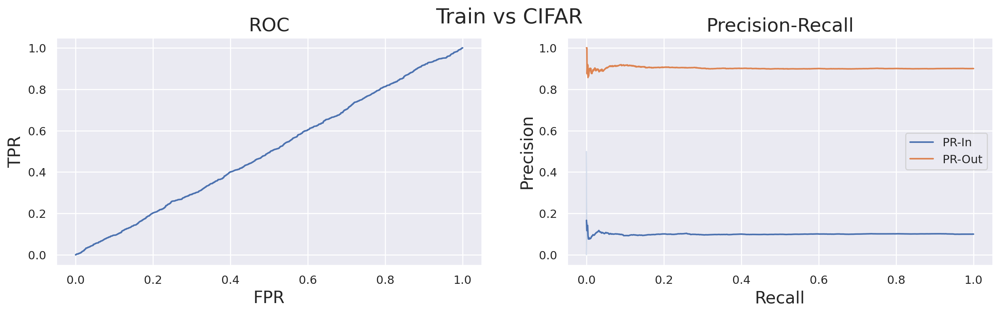

Train vs CIFAR
----------------
ROC-AUC: 0.5009
PR-AUC (In/Out): 0.0997 / 0.9014
FPR (95% TPR) Prec: 0.9462


{'roc_auc': 0.5009496666666666,
 'fpr_tpr95': 0.9462222222222222,
 'fpr_tpr80': 0.7865555555555556,
 'pr_auc_in': 0.09972253614591313,
 'pr_auc_out': 0.9013739918294564,
 'ap': 0.10012147568278762}

In [125]:
ood_metrics(-train_score, -test_score, names=(LABELS[0], LABELS[1]),plot=True, verbose=True)

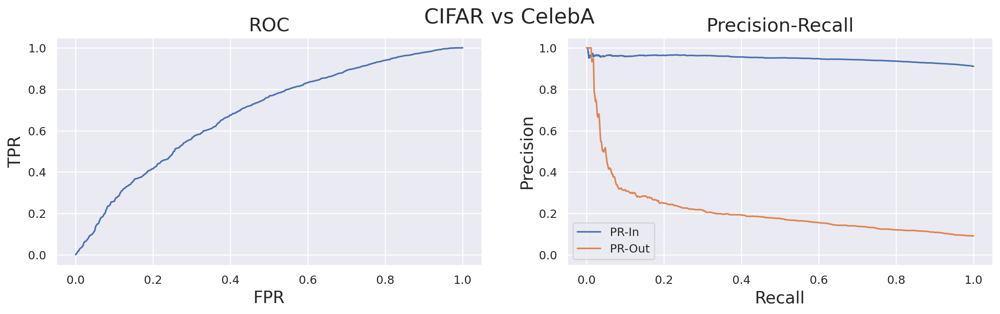

CIFAR vs CelebA
----------------
ROC-AUC: 0.6837
PR-AUC (In/Out): 0.9487 / 0.2108
FPR (95% TPR) Prec: 0.8180


{'roc_auc': 0.6836995,
 'fpr_tpr95': 0.818,
 'fpr_tpr80': 0.549,
 'pr_auc_in': 0.948719960636422,
 'pr_auc_out': 0.2108014125550742,
 'ap': 0.948730704423778}

In [182]:
ood_metrics(-test_score, -ood_scores[0], names=(LABELS[1], LABELS[2]), plot=True, verbose=True)

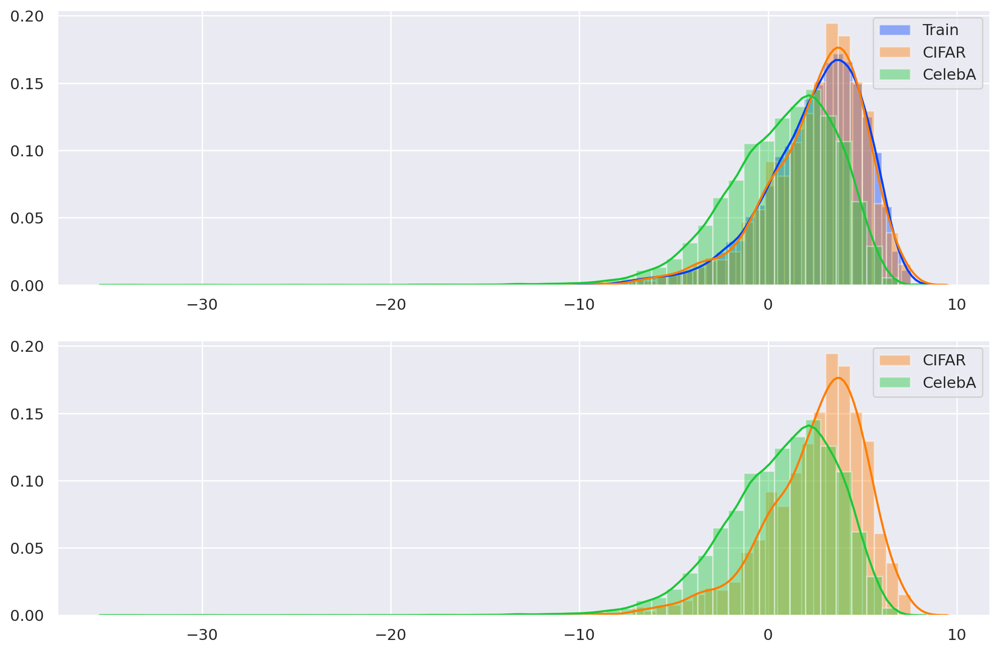

In [183]:
evaluate_model(train_score, test_score, ood_scores[0:1], labels=LABELS)

# Flow Models

In [66]:
import tensorflow_probability as tfp
tfb = tfp.bijectors
tfk = tf.keras
tfkl = tf.keras.layers
tfpl = tfp.layers
tfd = tfp.distributions

In [67]:
# X_train = 
X_train.shape

(2500, 10)

In [85]:
%%time
# Density estimation with MADE.
n = X_train.shape[0]
made = tfb.AutoregressiveNetwork(params=2, hidden_units=[256, 256], activation="elu")

distribution = tfd.TransformedDistribution(
    distribution=tfd.Normal(loc=0., scale=1.),
    bijector=tfb.MaskedAutoregressiveFlow(made),
    event_shape=[10])

# Construct and fit model.
x_ = tfkl.Input(shape=(10,), dtype=tf.float32)
log_prob_ = distribution.log_prob(x_)
model = tfk.Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adam(), #tf.optimizers.Adadelta(learning_rate=0.01),
              loss=lambda _, log_prob: -log_prob)

batch_size = 32
epochs = 500
history = model.fit(
    x=X_train,
    y=np.zeros((n, 0), dtype=np.float32),
    batch_size=batch_size,
    epochs=epochs,
    steps_per_epoch=n//batch_size,  # Usually `n // batch_size`.
    shuffle=True,
    verbose=True)

Epoch 1/1000
78/78 [==============================] - 0s 3ms/step - loss: 4289.6421
Epoch 2/1000
78/78 [==============================] - 0s 3ms/step - loss: 546.6472
Epoch 3/1000
78/78 [==============================] - 0s 3ms/step - loss: 428.1032
Epoch 4/1000
78/78 [==============================] - 0s 3ms/step - loss: 361.6230
Epoch 5/1000
78/78 [==============================] - 0s 3ms/step - loss: 315.1050
Epoch 6/1000
78/78 [==============================] - 0s 3ms/step - loss: 279.8078
Epoch 7/1000
78/78 [==============================] - 0s 3ms/step - loss: 249.5938
Epoch 8/1000
78/78 [==============================] - 0s 3ms/step - loss: 226.9623
Epoch 9/1000
78/78 [==============================] - 0s 3ms/step - loss: 207.0995
Epoch 10/1000
78/78 [==============================] - 0s 3ms/step - loss: 190.9148
Epoch 11/1000
78/78 [==============================] - 0s 3ms/step - loss: 177.3570
Epoch 12/1000
78/78 [==============================] - 0s 3ms/step - loss: 165.5387


In [ ]:
prev 6.68

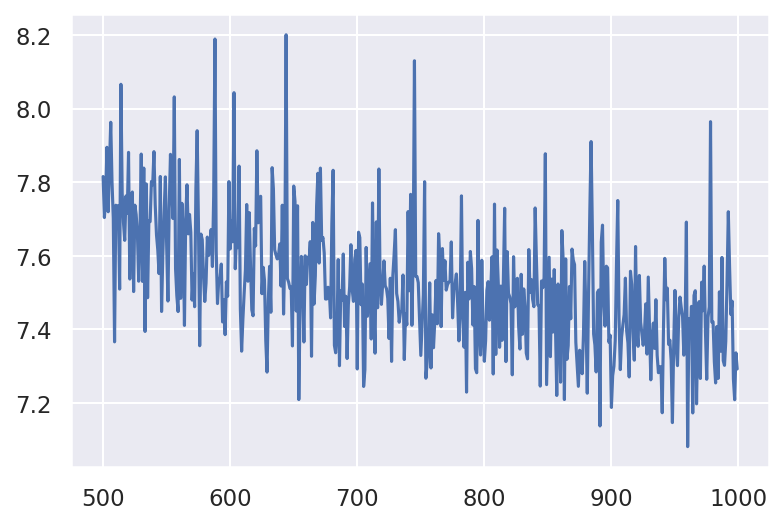

In [88]:
start_idx=500
plt.plot(range(start_idx, epochs), history.history["loss"][start_idx:])
# plt.yscale("log")

In [119]:
%%time
train_score = distribution.log_prob(X_train, dtype=np.float32).numpy()
test_score = distribution.log_prob(X_test, dtype=np.float32).numpy()
ood_scores = [distribution.log_prob(ood, dtype=np.float32).numpy() for ood in outlier_scores]

CPU times: user 4.27 s, sys: 1.79 s, total: 6.05 s
Wall time: 426 ms


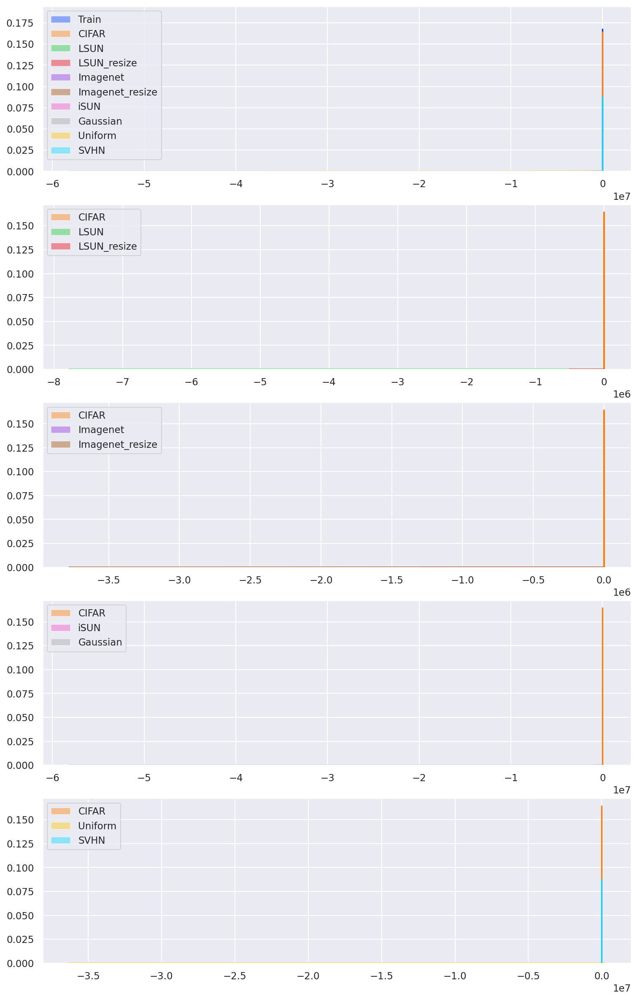

In [120]:
evaluate_model(train_score, test_score, ood_scores, labels=LABELS)

CIFAR vs LSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs LSUN_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Imagenet
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Imagenet_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs iSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Gaussian
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs Uniform
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.00%

CIFAR vs SVHN
----------------
ROC-AUC: 0.9761
PR-AUC (In/Out): 0.9865 / 0.9592
FPR (95% TPR) Prec: 8.37%



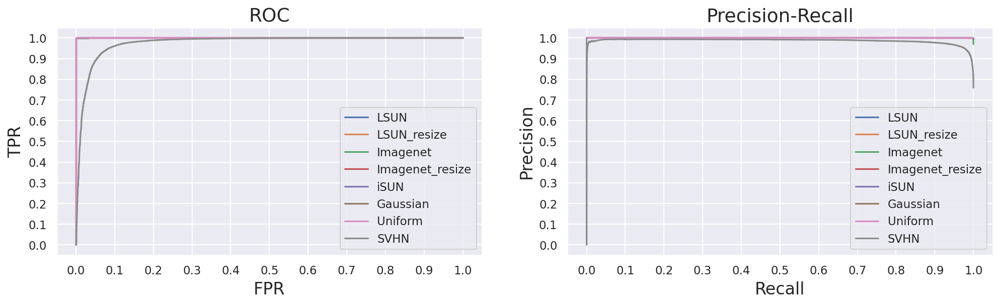

In [121]:
fig, axs = plt.subplots(1,2, figsize=(16,4))

for idx, _score in enumerate(ood_scores):
    ood_metrics(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]),
                    plot=False, verbose=True)
    print()
    plot_curves(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]), figure=(fig, axs))

plt.show()

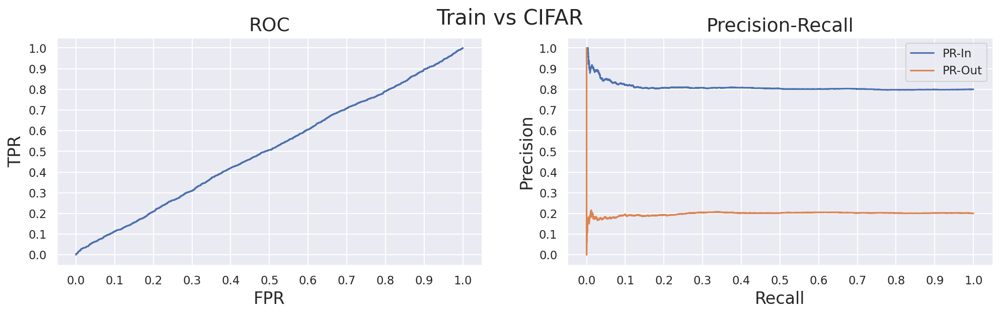

Train vs CIFAR
----------------
ROC-AUC: 0.5063
PR-AUC (In/Out): 0.8094 / 0.1990
FPR (95% TPR) Prec: 95.68%


{'roc_auc': 0.50631488,
 'fpr_tpr95': 0.9568,
 'fpr_tpr80': 0.8084,
 'pr_auc_in': 0.8093801110366999,
 'pr_auc_out': 0.19898669941667765,
 'ap': 0.8094143405780019}

In [92]:
ood_metrics(-train_score, -test_score, names=(LABELS[0], LABELS[1]),plot=True, verbose=True)

# Train

In [138]:
%%time
# Density estimation with MADE.
n = train_scores.shape[0]
made = tfb.AutoregressiveNetwork(params=2, hidden_units=[512, 512], activation="elu")

distribution = tfd.TransformedDistribution(
    distribution=tfd.Normal(loc=0., scale=1.),
    bijector=tfb.MaskedAutoregressiveFlow(made),
    event_shape=[10])

# Construct and fit model.
x_ = tfkl.Input(shape=(10,), dtype=tf.float32)
log_prob_ = distribution.log_prob(x_)
model = tfk.Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adam(), #tf.optimizers.Adadelta(learning_rate=0.01),
              loss=lambda _, log_prob: -log_prob)

batch_size = 32
epochs = 1000
history = model.fit(
    x=train_scores,
    y=np.zeros((n, 0), dtype=np.float32),
    batch_size=batch_size,
    epochs=epochs,
    steps_per_epoch=n//batch_size,  # Usually `n // batch_size`.
    shuffle=True,
    verbose=True)

Epoch 1/500
78/78 [==============================] - 0s 2ms/step - loss: 618557.6875
Epoch 2/500
78/78 [==============================] - 0s 2ms/step - loss: 3417.7444
Epoch 3/500
78/78 [==============================] - 0s 2ms/step - loss: 2478.6316
Epoch 4/500
78/78 [==============================] - 0s 2ms/step - loss: 1936.5325
Epoch 5/500
78/78 [==============================] - 0s 2ms/step - loss: 1677.7496
Epoch 6/500
78/78 [==============================] - 0s 2ms/step - loss: 1480.8983
Epoch 7/500
78/78 [==============================] - 0s 2ms/step - loss: 1320.6987
Epoch 8/500
78/78 [==============================] - 0s 2ms/step - loss: 1194.8048
Epoch 9/500
78/78 [==============================] - 0s 2ms/step - loss: 1084.4700
Epoch 10/500
78/78 [==============================] - 0s 2ms/step - loss: 986.1025
Epoch 11/500
78/78 [==============================] - 0s 2ms/step - loss: 895.5016
Epoch 12/500
78/78 [==============================] - 0s 2ms/step - loss: 822.7991
Ep

In [ ]:
prev 6.68

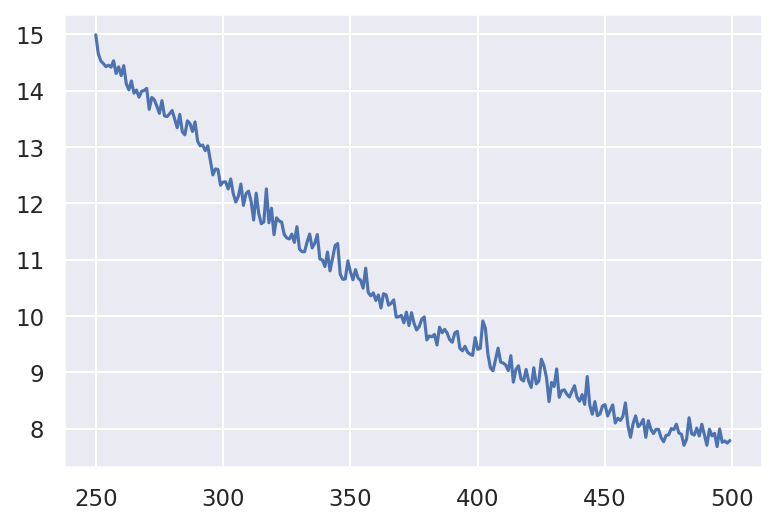

In [139]:
start_idx=250
plt.plot(range(start_idx, epochs), history.history["loss"][start_idx:])
# plt.yscale("log")

In [140]:
%%time
train_score = distribution.log_prob(X_train, dtype=np.float32).numpy()
test_score = distribution.log_prob(X_test, dtype=np.float32).numpy()
ood_scores = [distribution.log_prob(ood, dtype=np.float32).numpy() for ood in outlier_scores]

CPU times: user 1.01 s, sys: 917 ms, total: 1.93 s
Wall time: 265 ms


/usr/local/lib/python3.6/dist-packages/seaborn/utils.py:376: RuntimeWarning:

invalid value encountered in double_scalars

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:35: RuntimeWarning:

invalid value encountered in double_scalars



ValueError: cannot convert float NaN to integer

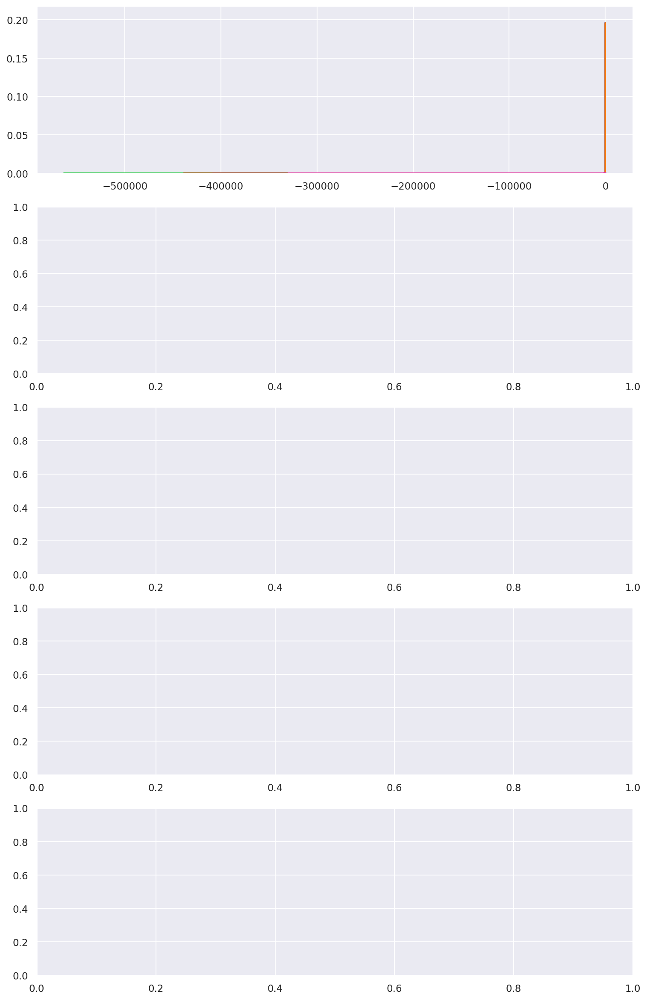

In [141]:
evaluate_model(train_score, test_score, ood_scores, labels=LABELS)

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(16,4))

for idx, _score in enumerate(ood_scores):
    ood_metrics(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]),
                    plot=False, verbose=True)
    print()
    plot_curves(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]), figure=(fig, axs))

plt.show()

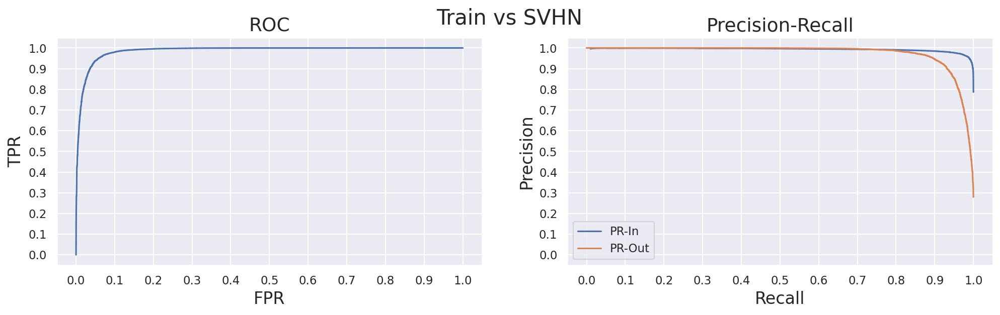

Train vs SVHN
----------------
ROC-AUC: 0.9859
PR-AUC (In/Out): 0.9934 / 0.9751
FPR (95% TPR) Prec: 5.79%


{'roc_auc': 0.9859338346153845,
 'fpr_tpr95': 0.0579,
 'fpr_tpr80': 0.0194,
 'pr_auc_in': 0.9933561288207654,
 'pr_auc_out': 0.9750509126380563,
 'ap': 0.9933563767964992}

In [137]:
ood_metrics(-test_score, -ood_scores[-1], names=(LABELS[0], LABELS[-1]),plot=True, verbose=True)

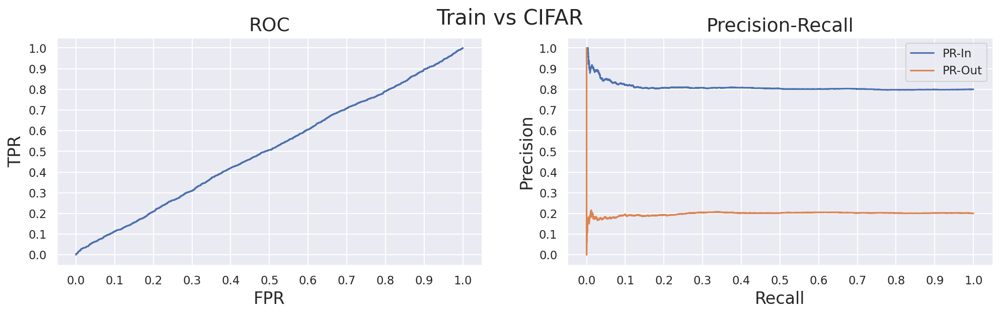

Train vs CIFAR
----------------
ROC-AUC: 0.5063
PR-AUC (In/Out): 0.8094 / 0.1990
FPR (95% TPR) Prec: 95.68%


{'roc_auc': 0.50631488,
 'fpr_tpr95': 0.9568,
 'fpr_tpr80': 0.8084,
 'pr_auc_in': 0.8093801110366999,
 'pr_auc_out': 0.19898669941667765,
 'ap': 0.8094143405780019}

In [92]:
ood_metrics(-train_score, -test_score, names=(LABELS[0], LABELS[1]),plot=True, verbose=True)

## Flow on CIFAR 10.1

In [ ]:
# Density estimation with MADE.
n = cifar101_scores.shape[0]
made = tfb.AutoregressiveNetwork(params=2, hidden_units=[64, 64], activation="elu")

distribution = tfd.TransformedDistribution(
    distribution=tfd.Normal(loc=0., scale=1.),
    bijector=tfb.MaskedAutoregressiveFlow(made),
    event_shape=[10])

# Construct and fit model.
x_ = tfkl.Input(shape=(10,), dtype=tf.float32)
log_prob_ = distribution.log_prob(x_)
model = tfk.Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adadelta(learning_rate=0.01), #tf.optimizers.Adadelta(learning_rate=0.01)
              loss=lambda _, log_prob: -log_prob)

batch_size = 32
epochs = 10000
history = model.fit(
    x=cifar101_scores,
    y=np.zeros((n, 0), dtype=np.float32),
    batch_size=batch_size,
    epochs=epochs,
    steps_per_epoch=n//batch_size,  # Usually `n // batch_size`.
    shuffle=True,
    verbose=True)

Epoch 1/10000
62/62 [==============================] - 0s 3ms/step - loss: 101923.2734
Epoch 2/10000
62/62 [==============================] - 0s 3ms/step - loss: 49438.5898
Epoch 3/10000
62/62 [==============================] - 0s 3ms/step - loss: 30334.8223
Epoch 4/10000
62/62 [==============================] - 0s 3ms/step - loss: 19976.3145
Epoch 5/10000
62/62 [==============================] - 0s 3ms/step - loss: 13788.4590
Epoch 6/10000
62/62 [==============================] - 0s 3ms/step - loss: 9766.0557
Epoch 7/10000
62/62 [==============================] - 0s 3ms/step - loss: 7289.1841
Epoch 8/10000
62/62 [==============================] - 0s 3ms/step - loss: 5659.6465
Epoch 9/10000
62/62 [==============================] - 0s 3ms/step - loss: 4555.8003
Epoch 10/10000
62/62 [==============================] - 0s 3ms/step - loss: 3781.5308
Epoch 11/10000
62/62 [==============================] - 0s 3ms/step - loss: 3216.5996
Epoch 12/10000
62/62 [==============================] - 0

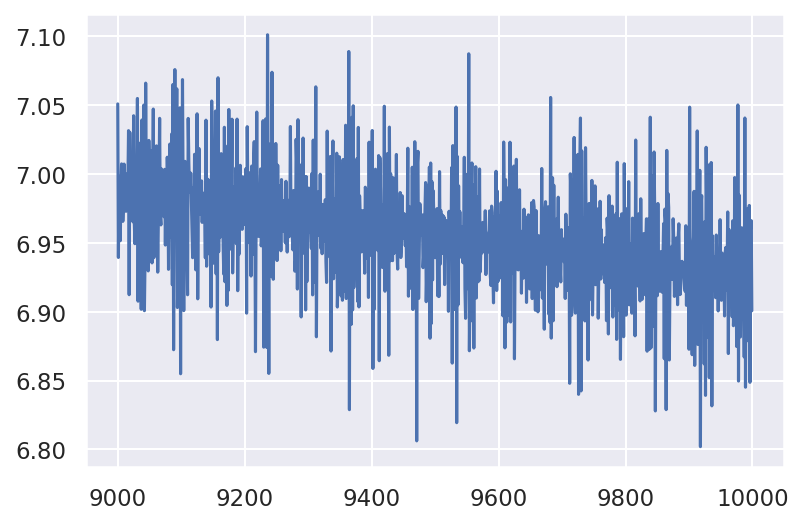

In [337]:
start_idx=9000
plt.plot(range(start_idx, epochs), history.history["loss"][start_idx:])
# plt.yscale("log")

In [338]:
%%time
train_score = distribution.log_prob(cifar101_scores, dtype=np.float32).numpy()
test_score = distribution.log_prob(inlier_scores, dtype=np.float32).numpy()
ood_scores = [distribution.log_prob(ood, dtype=np.float32).numpy() for ood in outlier_scores]

CPU times: user 146 ms, sys: 22.1 ms, total: 168 ms
Wall time: 161 ms


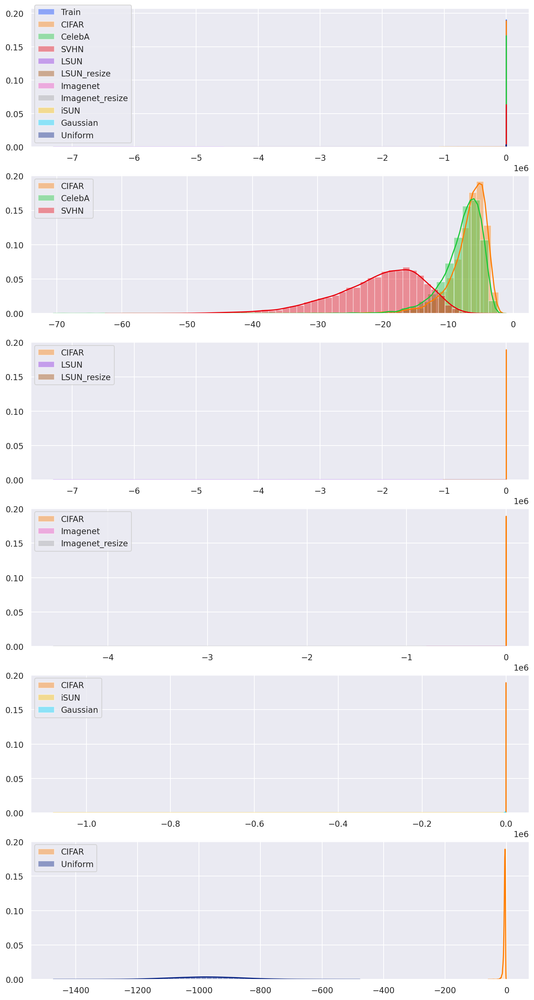

In [339]:
evaluate_model(train_score, test_score, ood_scores, labels=LABELS)

In [340]:
for idx, _score in enumerate(ood_scores):
    ood_metrics(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]),
                    plot=False, verbose=True)
    print()

CIFAR vs CelebA
----------------
ROC-AUC: 0.6025
PR-AUC (In/Out): 0.5716 / 0.6060
FPR (95% TPR) Prec: 0.8815

CIFAR vs SVHN
----------------
ROC-AUC: 0.9811
PR-AUC (In/Out): 0.9745 / 0.9846
FPR (95% TPR) Prec: 0.0753

CIFAR vs LSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs LSUN_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Imagenet
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Imagenet_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs iSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Gaussian
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Uniform
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.000

> ### Best w/ Adam 1000 iters 64x64

In [315]:
for idx, _score in enumerate(ood_scores):
    ood_metrics(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]),
                    plot=False, verbose=True)
    print()

CIFAR vs CelebA
----------------
ROC-AUC: 0.6499
PR-AUC (In/Out): 0.6016 / 0.6742
FPR (95% TPR) Prec: 0.8032

CIFAR vs SVHN
----------------
ROC-AUC: 0.9927
PR-AUC (In/Out): 0.9925 / 0.9932
FPR (95% TPR) Prec: 0.0327

CIFAR vs LSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs LSUN_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Imagenet
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Imagenet_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs iSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Gaussian
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Uniform
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.000

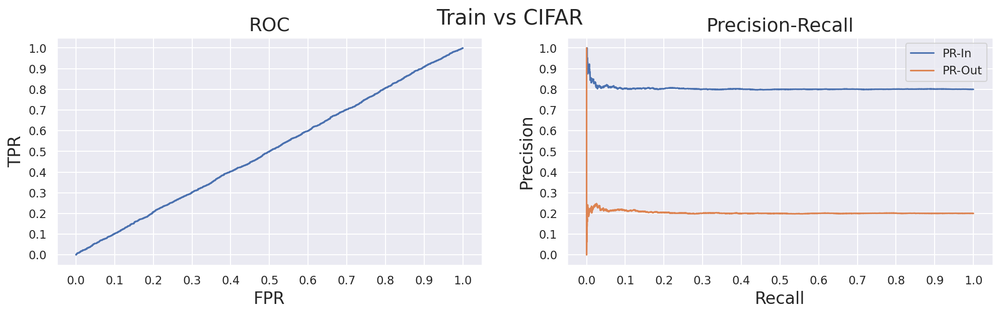

Train vs CIFAR
----------------
ROC-AUC: 0.5031
PR-AUC (In/Out): 0.8036 / 0.2032
FPR (95% TPR) Prec: 94.52%


{'roc_auc': 0.5031055400000001,
 'fpr_tpr95': 0.9452,
 'fpr_tpr80': 0.794,
 'pr_auc_in': 0.8035587348285793,
 'pr_auc_out': 0.20323321456865953,
 'ap': 0.8036021113016529}

In [77]:
ood_metrics(-train_score, -test_score, names=(LABELS[0], LABELS[1]),plot=True, verbose=True)

## CIFAR 10.1 Train

In [24]:
with open("cifar101_scores_ckpt-9.p", "rb") as f:
    cifar101_scores = pickle.load(f).numpy()
cifar101_scores.shape

(2000, 10)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    1.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    5.4s finished


Best: 2.194353 using {'GMM__covariance_type': 'full', 'GMM__n_components': 4}
---------------------------------------------------------------------------
2.025019 (0.181192) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 2}
2.194353 (0.177301) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 4}
2.171661 (0.175992) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 6}
2.115797 (0.160683) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 8}
2.061053 (0.168765) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 10}
1.986413 (0.189924) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 12}
1.890931 (0.186764) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 14}
1.776964 (0.237767) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 16}
1.682005 (0.280287) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 18}
1.573046 (0.260787) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 20}
CPU times:

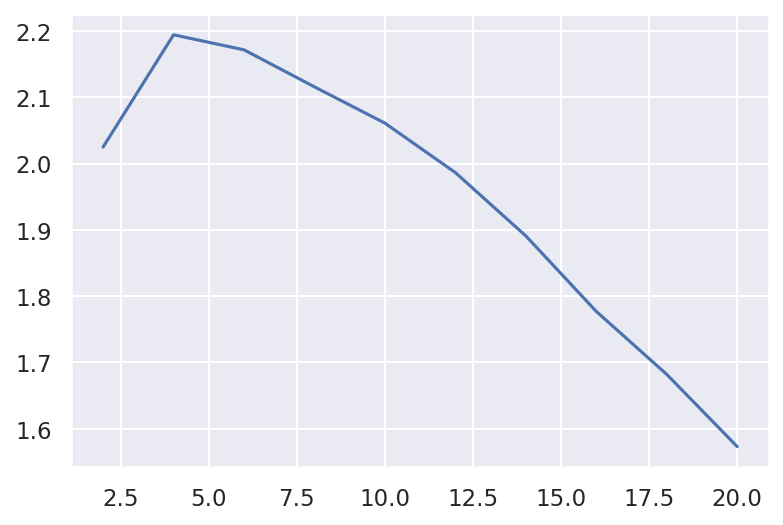

In [25]:
%%time
alt_gmm_clf = train_gmm(cifar101_scores, verbose=True)

In [26]:
print("---Likelihoods---")
print("Training: {:.3f}".format(alt_gmm_clf.score(cifar101_scores)))
print("{}: {:.3f}".format(LABELS[1], alt_gmm_clf.score(inlier_scores)))

for name, ood in zip(LABELS[2:], outlier_scores):
    print("{}: {:.3f}".format(name, alt_gmm_clf.score(ood)))

---Likelihoods---
Training: 2.389
CIFAR: 2.189
CelebA: 0.749
SVHN: -7.969
LSUN: -1824.531
LSUN_resize: -972.211
Imagenet: -1049.646
Imagenet_resize: -1280.229
iSUN: -1057.816
Gaussian: -1075.318
Uniform: -701.261


In [27]:
%%time
train_score = alt_gmm_clf.score_samples(X_train)
test_score = alt_gmm_clf.score_samples(inlier_scores)
ood_scores = [alt_gmm_clf.score_samples(ood) for ood in outlier_scores]

CPU times: user 5.44 s, sys: 7.55 s, total: 13 s
Wall time: 284 ms


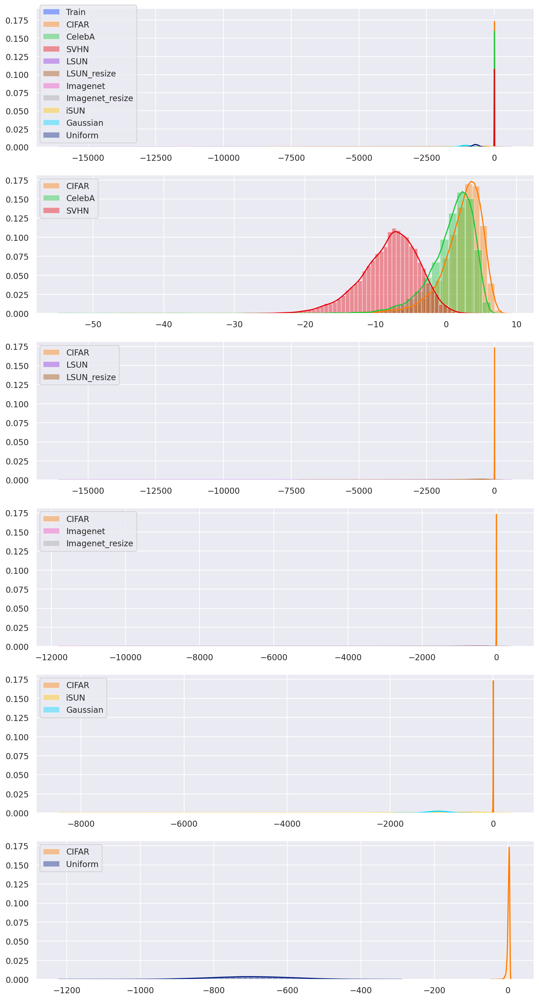

In [28]:
evaluate_model(train_score, test_score, ood_scores, labels=LABELS)

# OOD Evaluation

In [29]:
for idx, _score in enumerate(ood_scores):
    ood_metrics(-test_score, -_score, names=(LABELS[1], LABELS[idx+2]),
                    plot=False, verbose=True)
    print()

CIFAR vs CelebA
----------------
ROC-AUC: 0.6500
PR-AUC (In/Out): 0.6105 / 0.6737
FPR (95% TPR) Prec: 0.8054

CIFAR vs SVHN
----------------
ROC-AUC: 0.9752
PR-AUC (In/Out): 0.9586 / 0.9814
FPR (95% TPR) Prec: 0.0803

CIFAR vs LSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs LSUN_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Imagenet
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Imagenet_resize
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs iSUN
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Gaussian
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000

CIFAR vs Uniform
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.000

In [45]:
idxs = [i for i,x in enumerate(ood_names) if x in ["LSUN", "Imagenet", "iSUN"] ]

In [46]:
all_images = np.concatenate([ood_scores[i] for i in idxs])
all_images.shape

(28925,)

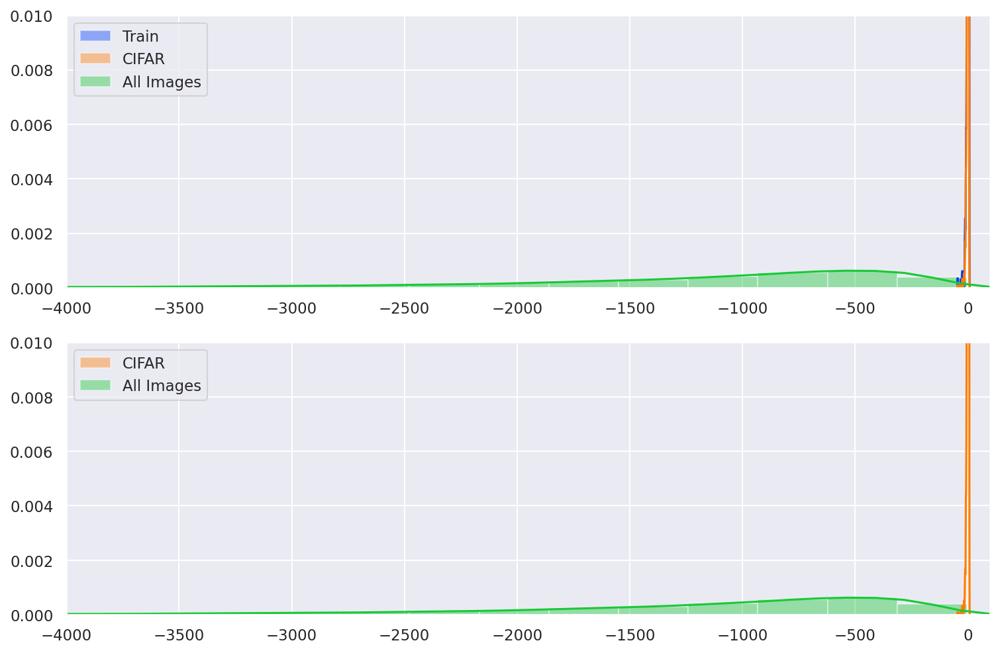

In [47]:
evaluate_model(train_score, test_score, [all_images], labels=(*LABELS[:2], "All Images"), ylim=0.01, xlim=-4000)

In [48]:
ood_metrics(-test_score, -all_images, names=(LABELS[1], "All Images"),plot=False, verbose=True)

CIFAR vs All Images
----------------
ROC-AUC: 1.0000
PR-AUC (In/Out): 1.0000 / 1.0000
FPR (95% TPR) Prec: 0.0000


{'roc_auc': 0.9999969369057908,
 'fpr_tpr95': 0.0,
 'fpr_tpr80': 0.0,
 'pr_auc_in': 0.999998949229284,
 'pr_auc_out': 0.9999910428702063,
 'ap': 0.9999989492473076}

# Validation Check

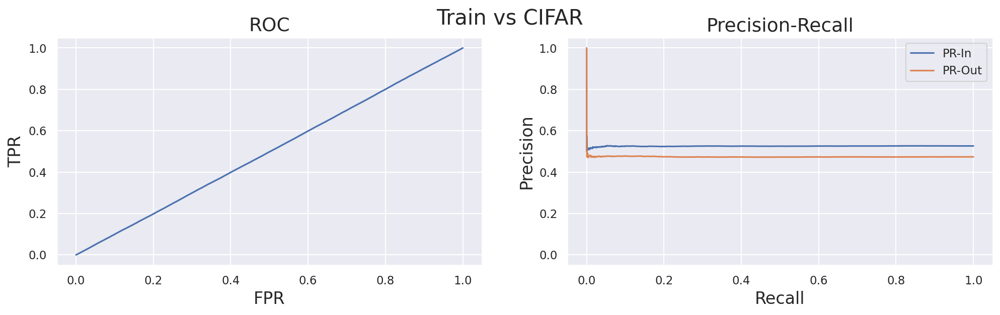

Train vs CIFAR
----------------
ROC-AUC: 0.4993
PR-AUC (In/Out): 0.5254 / 0.4738
FPR (95% TPR) Prec: 0.9484


{'roc_auc': 0.49925197777777774,
 'fpr_tpr95': 0.9484444444444444,
 'fpr_tpr80': 0.7996666666666666,
 'pr_auc_in': 0.5253750010222078,
 'pr_auc_out': 0.4737735864095699,
 'ap': 0.5253513168116815}

In [207]:
ood_metrics(-train_score, -test_score, names=(LABELS[0], LABELS[1]),plot=True, verbose=True)

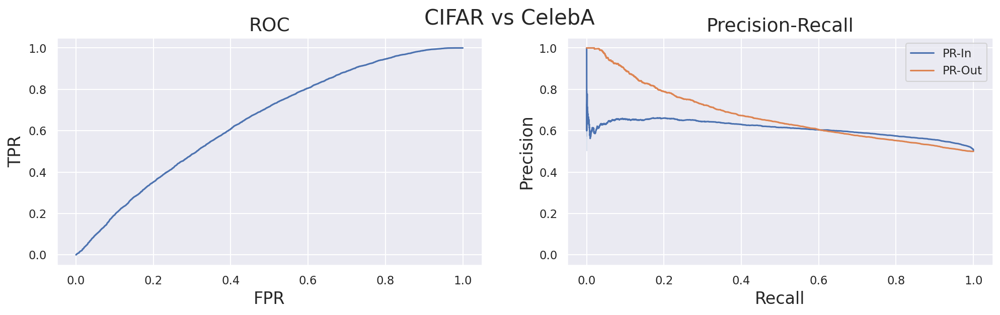

CIFAR vs CelebA
----------------
ROC-AUC: 0.6500
PR-AUC (In/Out): 0.6105 / 0.6737
FPR (95% TPR) Prec: 0.8054


{'roc_auc': 0.6499908000000001,
 'fpr_tpr95': 0.8054,
 'fpr_tpr80': 0.5918,
 'pr_auc_in': 0.6104940884181009,
 'pr_auc_out': 0.6736728315976925,
 'ap': 0.610591251094821}

In [208]:
ood_metrics(-test_score, -ood_scores[0], names=(LABELS[1], LABELS[2]), plot=True, verbose=True)

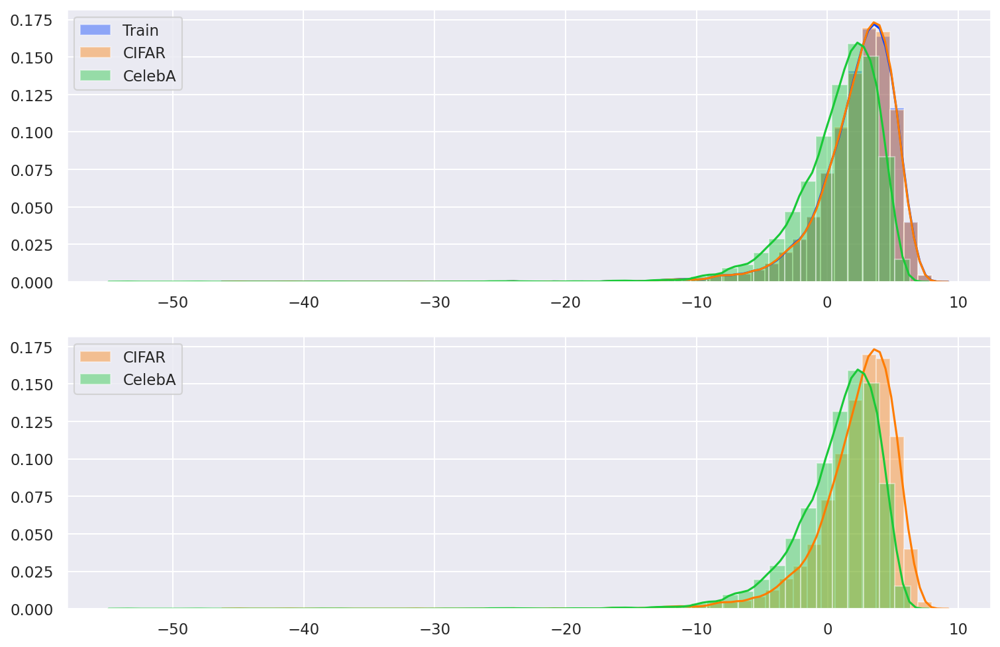

In [209]:
evaluate_model(train_score, test_score, ood_scores[0:1], labels=LABELS)

# UMAP

### Score Norms

In [87]:
samples_train = np.concatenate((test_data[:9000], outlier_data_1[:9000], outlier_data_2[:9000]))
samples_test  = np.concatenate((test_data[9000:], outlier_data_1[9000:], outlier_data_2[9000:]))

samples_train.shape

(27000, 10)

In [85]:
%%time
reducer = umap.UMAP(random_state=42,
                    n_components = 3,
                    n_neighbors=15,
                    min_dist=0.1)
reducer.fit(samples_train)

CPU times: user 59.2 s, sys: 1min 2s, total: 2min 2s
Wall time: 32 s


UMAP(n_components=3, random_state=42)

In [88]:
%%time
embedding = reducer.transform(samples_test)

CPU times: user 1.99 s, sys: 49.7 ms, total: 2.04 s
Wall time: 2.01 s


In [97]:
embedding.shape

(2962, 3)

In [96]:
[shapes[idx-1][0]-9000 for idx in range(1,4)]

[1000, 962, 1000]

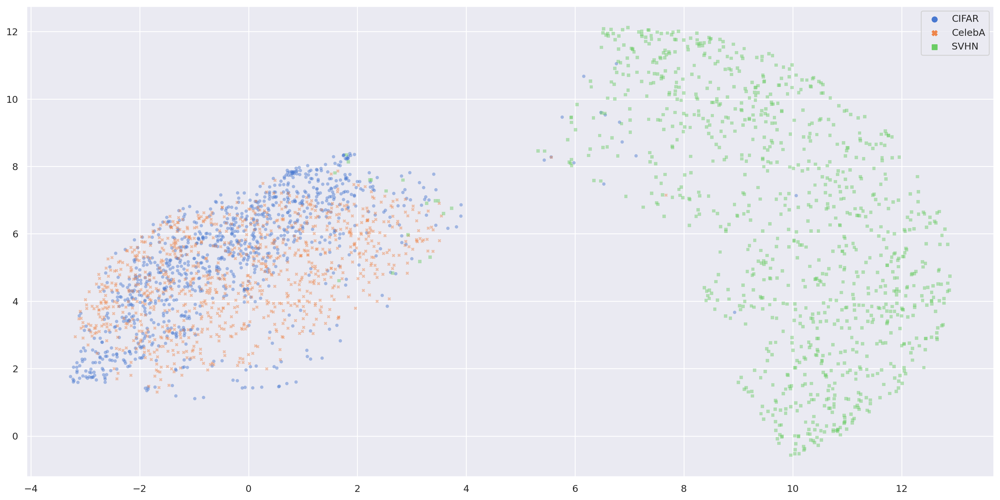

In [102]:
plt.figure(figsize=(20,10))

captions_test = np.concatenate([[LABELS[idx]]*(shapes[idx-1][0]-9000) for idx in range(1,4)])
labels_test = np.concatenate([[idx]*(shapes[idx-1][0]-9000) for idx in range(1,4)])
sns.scatterplot(x=embedding[:, 0],
                y=embedding[:, 1],
                hue=captions_test, style=captions_test, s=15, alpha=0.45, palette="muted", edgecolor="none")
plt.show()
# plt.close()

In [103]:
emb3d = go.Scatter3d(
    x=embedding[:,0],
    y=embedding[:,1],
    z=embedding[:,2],
    mode="markers",
    name="Score Norms",
    marker=dict(
        size=2,
        color=labels_test,
        colorscale="Blackbody",
        opacity=0.5,
        showscale=True
    ),
    text=captions_test
)

layout = go.Layout(
    title="3D UMAP",
    autosize=False,
    width=1000,
    height=800,
#     paper_bgcolor='#F5F5F5',
#     template="plotly"
)

data=[emb3d]

fig = go.Figure(data=data, layout=layout)
fig.show("notebook")

## GMM on Embeddings

In [106]:
%%time
X_train_embedding = reducer.transform(X_train)
X_test_embedding = reducer.transform(X_test)
outlier_1_embedding = reducer.transform(outlier_data_1[9000:])
outlier_2_embedding = reducer.transform(outlier_data_2[9000:])

CPU times: user 9.6 s, sys: 340 ms, total: 9.94 s
Wall time: 9.82 s


In [155]:
outlier_train_embedding_1 = reducer.transform(outlier_data_1[:9000])
outlier_train_embedding_2 = reducer.transform(outlier_data_2[:9000])

In [107]:
X_train, X_test =  test_data[:9000], test_data[9000:]

In [131]:
%%time
gmm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
])

param_grid = dict(GMM__n_components = range(20,101,10),
                  GMM__covariance_type = ['full']) # Full always performs best 

grid = GridSearchCV(estimator=gmm_clf,
                    param_grid=param_grid,
                    cv=10, n_jobs=10,
                    verbose=1)

grid_result = grid.fit(X_train_embedding)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  90 out of  90 | elapsed:   38.6s finished


CPU times: user 59.3 s, sys: 8.16 s, total: 1min 7s
Wall time: 43.4 s


Best: -2.327967 using {'GMM__covariance_type': 'full', 'GMM__n_components': 100}
---------------------------------------------------------------------------
-2.662801 (0.046925) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 20}
-2.573499 (0.042412) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 30}
-2.506286 (0.047969) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 40}
-2.454949 (0.040034) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 50}
-2.428373 (0.039311) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 60}
-2.401051 (0.052309) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 70}
-2.368396 (0.039467) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 80}
-2.348367 (0.041998) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 90}
-2.327967 (0.038845) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 100}


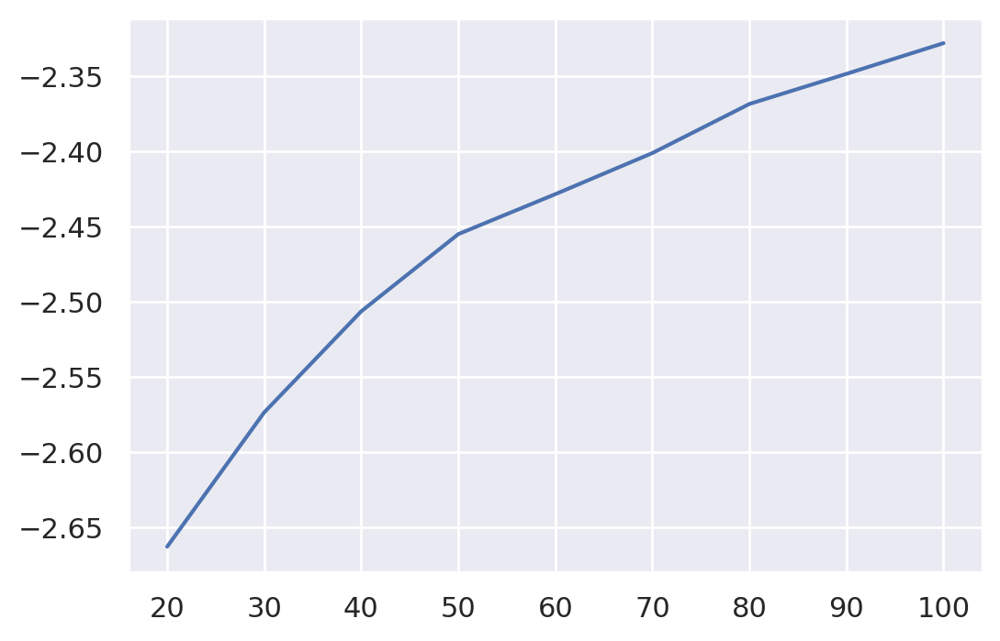

In [135]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("-----"*15)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
plt.plot([p["GMM__n_components"] for p in params], means)

In [143]:
best_params = grid.best_params_

best_gmm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
]).set_params(**{'GMM__covariance_type': 'full', 'GMM__n_components': 20})

best_gmm_clf.fit(X_train_embedding)

print("Training Likelihood: {:.3f}".format(best_gmm_clf.score(X_train_embedding)))
print("{} Likelihood: {:.3f}".format(LABELS[1], best_gmm_clf.score(X_test_embedding)))
print("{} Likelihood: {:.3f}".format(LABELS[2], best_gmm_clf.score(outlier_1_embedding)))
print("{} Likelihood: {:.3f}".format(LABELS[3], best_gmm_clf.score(outlier_2_embedding)))

Training Likelihood: -2.651
CIFAR Likelihood: -2.703
CelebA Likelihood: -4.148
SVHN Likelihood: -21.181


In [ ]:
Training Likelihood: -2.535
CIFAR Likelihood: -2.615
CelebA Likelihood: -4.136
SVHN Likelihood: -21.257

In [144]:
train_score = best_gmm_clf.score_samples(X_train_embedding)
test_score = best_gmm_clf.score_samples(X_test_embedding)
outlier_score = best_gmm_clf.score_samples(outlier_1_embedding)
outlier_score_2 = best_gmm_clf.score_samples(outlier_2_embedding)

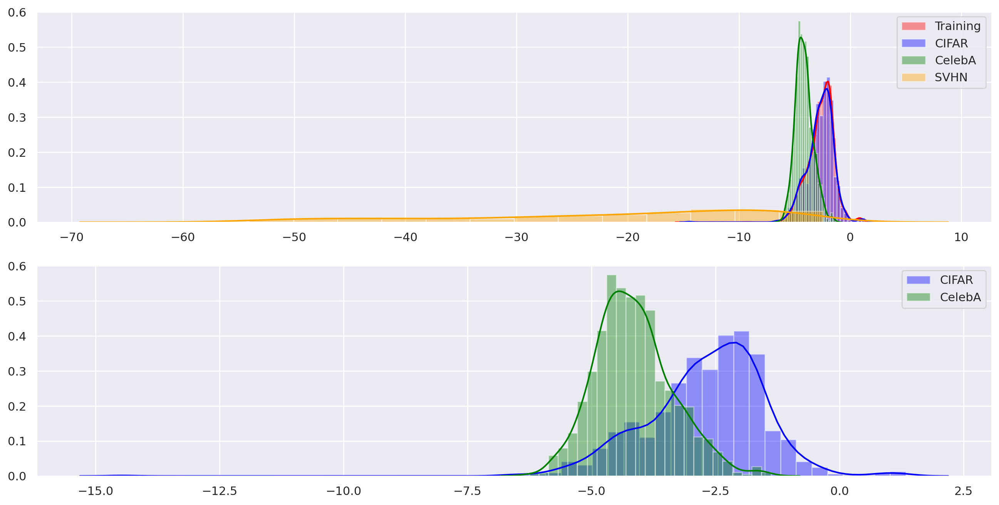

In [145]:
fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score,color=colors[0], label="Training", ax=axs[0])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])

sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1])

axs[0].legend()
axs[1].legend()
plt.show()

In [ ]:
from concurrent.futures import ThreadPoolExecutor
from sklearn.metrics import roc_auc_score

def evaluate_GMM(n):
    gmm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
    ]).set_params(**{'GMM__covariance_type': 'full', 'GMM__n_components': n})
    
    gmm_clf.fit(X_train_embedding)
    
    test_score = gmm_clf.score_samples(X_test_embedding)
    outlier_score = gmm_clf.score_samples(outlier_train_embedding_1)
    outlier_score_2 = gmm_clf.score_samples(outlier_train_embedding_2)
    
    y_true = np.concatenate((np.zeros(len(test_score)),
                             np.ones(len(outlier_score)),
                             np.ones(len(outlier_score_2))
                            ))
    
    y_scores = -np.concatenate((test_score, outlier_score, outlier_score_2))


    roc_auc = roc_auc_score(y_true,y_scores)
    
    return roc_auc

In [ ]:
%%time

max_n_component = 25
component_range = range(1, max_n_component+1, 1)

with ThreadPoolExecutor(max_workers = 6) as exc:
    result = list(exc.map(evaluate_GMM, component_range))
    
result = np.array(result)

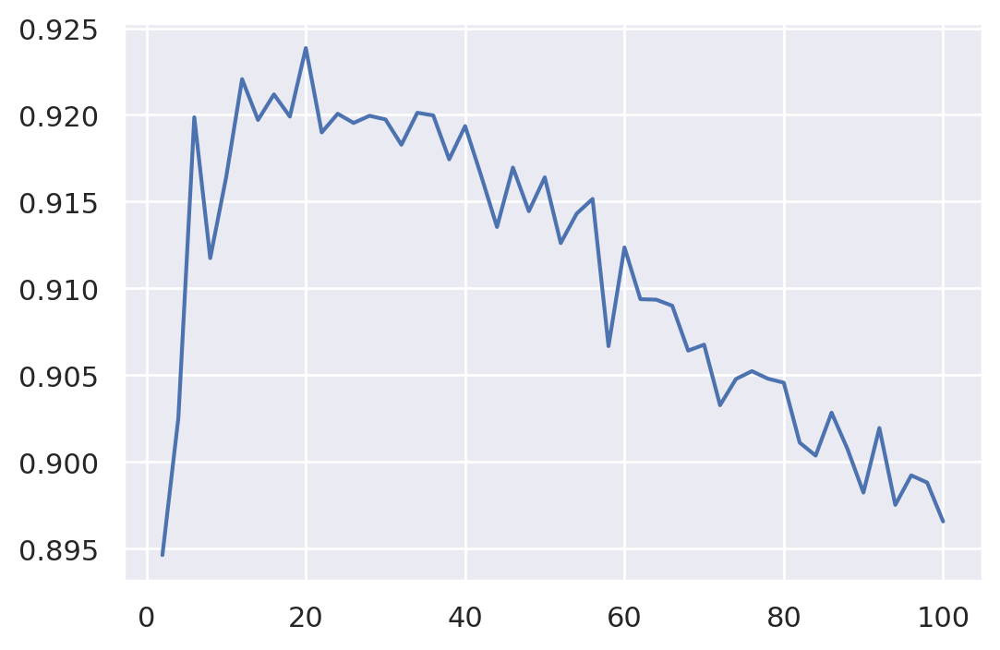

In [166]:
plt.plot(component_range, result)

print("Best -> {}:{:.3f} ".format(component_range[np.argmax(result)], np.max(result)))

In [ ]:
y_true = np.concatenate((np.zeros(len(inlier_score)),
                         np.ones(len(outlier_score))))
y_scores = np.concatenate((inlier_score, outlier_score))


roc_auc = roc_auc_score(y_true,y_scores)

In [151]:
metrics(-test_score, -np.concatenate((outlier_score, outlier_score_2)), plot=False, verbose=True)
plt.show()

Inlier vs Outlier
----------------
ROC-AUC: 0.9197
PR-AUC: 0.9564
Avg Prec: 0.9564


**CIFAR vs CelebA**

In [146]:
metrics(-test_score, -outlier_score, plot=False, verbose=True)
plt.show()

Inlier vs Outlier
----------------
ROC-AUC: 0.8493
PR-AUC: 0.7716
Avg Prec: 0.7724


**CIFAR vs SVHN**

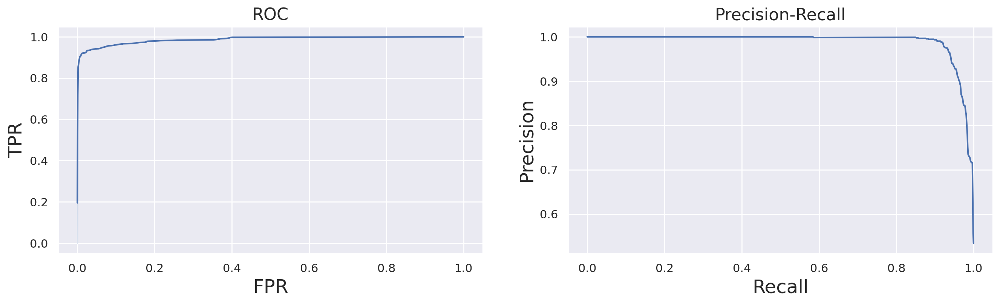

Inlier vs Outlier
----------------
ROC-AUC: 0.9868
PR-AUC: 0.9893
Avg Prec: 0.9893


In [119]:
metrics(-test_score, -outlier_score_2, plot=True, verbose=True)
plt.show()